In [1]:
import os
import cv2
import shutil

In [34]:
# draw bbx of a fiven image
import cv2

def drawBBX(LabelPath, ImPath, display_size=None):
    image = cv2.imread(ImPath)
    if image is None:
        print(f"Error: Could not read image at {ImPath}")
        return  
    
    imH, imW, _ = image.shape
    with open(LabelPath, 'r') as f:
        lines = f.readlines()
    
    for line in lines:
        parts = line.split()
        label = int(parts[0])
        x_center = float(parts[1]) * imW
        y_center = float(parts[2]) * imH
        w = float(parts[3]) * imW
        h = float(parts[4]) * imH
    
        x1 = int(x_center - w / 2)
        y1 = int(y_center + h / 2)
        x2 = int(x_center + w / 2)
        y2 = int(y_center - h / 2)
        
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 200, 0), 2)
        cv2.putText(image, f'{label}', (x1, y2 + 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 70, 0), 2, cv2.LINE_AA)
    
    if display_size is not None:
        image = cv2.resize(image, display_size)
    
    cv2.imshow('Image with Bounding Boxes', image)
    cv2.waitKey(0) 
    cv2.destroyAllWindows()



ImPath = r'C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\phone\phdata2\valid\images\phone-2-_jpg.rf.9586b884fcdc2f7b2ee14b23c49c1898.jpg'
LabelPath = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\phone\phdata2\valid\labels\phone-2-_jpg.rf.9586b884fcdc2f7b2ee14b23c49c1898.txt"
drawBBX(LabelPath, ImPath, display_size=(800, 800))

In [7]:
# counting the occurence of each class label
labelsC = {f'{i}' : 0 for i in range(30)}
folder_path = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data"
for direc in ['train\labels', 'test\labels', 'valid\labels']:
    filesP = os.path.join(folder_path, direc)
    for file in os.listdir(filesP):
        if file.endswith(".txt"):
            FilePath = os.path.join(filesP, file)
            with open(FilePath, 'r') as f:
                lines = f.readlines()
            for line in lines:
                parts=line.split()
                labelsC[parts[0]] +=1

        
print(labelsC)

{'0': 2948, '1': 2531, '2': 2510, '3': 3665, '4': 3409, '5': 3970, '6': 3084, '7': 4690, '8': 5735, '9': 5197, '10': 6373, '11': 8408, '12': 6640, '13': 0, '14': 0, '15': 0, '16': 0, '17': 0, '18': 0, '19': 0, '20': 0, '21': 0, '22': 0, '23': 0, '24': 0, '25': 0, '26': 0, '27': 0, '28': 0, '29': 0}


<Axes: xlabel='label', ylabel='count'>

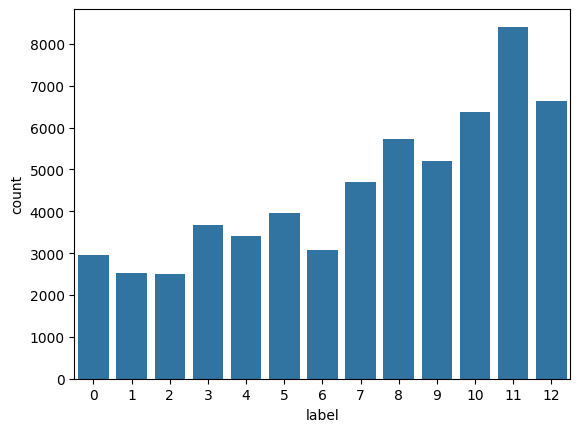

In [22]:
# plot class label occurence distribution
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
df = pd.DataFrame(list(labelsC.items())[:13], columns = ['label', 'count'])

sns.barplot(data = df, x='label',y='count')

In [9]:
# move files to 2 folders images and labels
p = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\Cheating Scenario Dataset in Online Exam"
imagesP = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\images"
labelsP = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\labels"

for root, dirs, files in os.walk(p):
    for file in files:
        fileP = os.path.join(root, file)
        if file.endswith('.jpg'):
            fileDestP = os.path.join(imagesP, file)  
            shutil.move(fileP, fileDestP)
            print(f'Moved: {fileP} -> {fileDestP}')
        elif file.endswith('.txt'):
            fileDestP = os.path.join(labelsP, file)  
            shutil.move(fileP, fileDestP)
            print(f'Moved: {fileP} -> {fileDestP}')

Moved: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\Cheating Scenario Dataset in Online Exam\Scenario 1\S1_00000000.jpg -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\images\S1_00000000.jpg
Moved: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\Cheating Scenario Dataset in Online Exam\Scenario 1\S1_00000000.txt -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\labels\S1_00000000.txt
Moved: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\Cheating Scenario Dataset in Online Exam\Scenario 1\S1_00000001.jpg -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\Cheating Scenario Dataset in Online Exam\images\S1_00000001.jpg
Moved: C:\Users\user\Desktop\ci2\Projet\Online ch

In [15]:
# split the data into 70% train, 20% valid and 10% test
import os
import shutil
import random

images_folder = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\images"
labels_folder = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\labels"
dataset_folder = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data"

# Define train, test, and validation folders
train_folder = os.path.join(dataset_folder, 'train')
test_folder = os.path.join(dataset_folder, 'test')
valid_folder = os.path.join(dataset_folder, 'valid')

# Create the directory structure
for split_folder in [train_folder, test_folder, valid_folder]:
    os.makedirs(os.path.join(split_folder, 'images'), exist_ok=True)
    os.makedirs(os.path.join(split_folder, 'labels'), exist_ok=True)

# Get a list of all images and shuffle it for random selection
all_images = os.listdir(images_folder)
random.shuffle(all_images)

# Calculate split sizes
train_size = int(0.7 * len(all_images))
test_size = int(0.1 * len(all_images))
valid_size = len(all_images) - train_size - test_size

# Split the data
train_images = all_images[:train_size]
test_images = all_images[train_size:train_size + test_size]
valid_images = all_images[train_size + test_size:]

# Helper function to move files
def move_files(image_list, destination_folder):
    for image in image_list:
        image_path = os.path.join(images_folder, image)
        label_path = os.path.join(labels_folder, os.path.splitext(image)[0] + '.txt')
        
        # Move image if it exists
        if os.path.exists(image_path):
            shutil.move(image_path, os.path.join(destination_folder, 'images', image))
            print(f"Moved image: {image_path} -> {os.path.join(destination_folder, 'images', image)}")
        
        # Move corresponding label if it exists
        if os.path.exists(label_path):
            shutil.move(label_path, os.path.join(destination_folder, 'labels', os.path.splitext(image)[0] + '.txt'))
            print(f"Moved label: {label_path} -> {os.path.join(destination_folder, 'labels', os.path.splitext(image)[0] + '.txt')}")

# Move the files into train, test, and valid folders
move_files(train_images, train_folder)
move_files(test_images, test_folder)
move_files(valid_images, valid_folder)

print("Data successfully split into train, test, and valid folders.")


Moved image: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\images\S3U_00001470.jpg -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\train\images\S3U_00001470.jpg
Moved label: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\labels\S3U_00001470.txt -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\train\labels\S3U_00001470.txt
Moved image: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\images\S1_00003258.jpg -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\train\images\S1_00003258.jpg
Moved label: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\labels\S1_00003258.txt -> C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\train\labels\S1_00003258.txt
Moved image: C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\pose\images\S3U_00001044.jpg -> C:\Users\user\Desktop\ci2\Projet\Onl

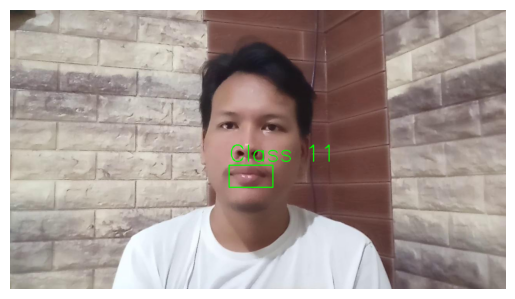

In [63]:
# search for a specific class label and plot its corresp images and bbx
import os
import cv2
import matplotlib.pyplot as plt

# Paths to images and labels folders
images_folder = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\valid\images"
labels_folder = r"C:\Users\user\Desktop\ci2\Projet\Online cheating in exam detection\data\valid\labels"

def find_and_draw_class(class_id):
    # Search for an image containing the specified class
    for label_file in os.listdir(labels_folder):
        label_path = os.path.join(labels_folder, label_file)
        
        # Check if this label file contains the specified class
        with open(label_path, 'r') as file:
            lines = file.readlines()
            for line in lines:
                line_class_id = int(line.split()[0])
                if line_class_id == class_id:
                    # Found an image with the specified class; get corresponding image path
                    image_file = label_file.replace('.txt', '.jpg')
                    image_path = os.path.join(images_folder, image_file)
                    
                    # Draw bounding boxes on the image
                    draw_bounding_boxes(image_path, label_path, class_id)
                    return  # Stop after finding the first matching image

    print(f"No images found containing class {class_id}")

# Function to draw bounding boxes for a specified class
def draw_bounding_boxes(image_path, label_path, class_id):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    # Read the label file and draw bounding boxes for objects of the specified class
    with open(label_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            parts = line.split()
            line_class_id = int(parts[0])
            
            # Only draw bounding box if class matches
            if line_class_id == class_id:
                x_center, y_center, box_width, box_height = map(float, parts[1:])
                
                # Calculate bounding box coordinates
                x1 = int((x_center - box_width / 2) * width)
                y1 = int((y_center - box_height / 2) * height)
                x2 = int((x_center + box_width / 2) * width)
                y2 = int((y_center + box_height / 2) * height)
                
                # Draw the bounding box and label on the image
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(image, f"Class {class_id}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 0), 2)

    # Display the image with bounding boxes
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Usage example: Find and draw an image with class label 3
find_and_draw_class(class_id=11)
